# Detección de objetos
Dataset: https://www.kaggle.com/datasets/yusufberksardoan/traffic-detection-project/data

In [1]:
# verificamos que haya GPU
!nvidia-smi

Sun Dec 10 02:27:27 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Instalación de YOLOv8 y otras librerías

In [2]:
# Pip install method (recommended)

!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()
from ultralytics import YOLO

from IPython.display import display, Image
import cv2
from google.colab.patches import cv2_imshow
import os
import random
import matplotlib.pyplot as plt
import glob
from PIL import Image
import numpy as np
import time


Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 27.0/78.2 GB disk)


## Exploración del dataset

In [7]:
!pip install opendatasets

In [9]:
import opendatasets as od
od.download('https://www.kaggle.com/datasets/yusufberksardoan/traffic-detection-project/data')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: marcosb96
Your Kaggle Key: ··········


100%|██████████| 583M/583M [00:08<00:00, 74.7MB/s]


In [10]:
# El dataset utilizado ya viene separado en test, train y validación. Los tamaños de cada subset son los siguientes:
image_folders = {
    'train': "/content/traffic-detection-project/train/images",
    'valid': "/content/traffic-detection-project/valid/images",
    'test': "/content/traffic-detection-project/test/images",
}

for folder in list(image_folders.values()):
    count = 0
    for entry in os.listdir(folder):
        if os.path.isfile(os.path.join(folder, entry)):
            count += 1
    print(f"{folder}: {count} files")

/content/traffic-detection-project/train/images: 5805 files
/content/traffic-detection-project/valid/images: 549 files
/content/traffic-detection-project/test/images: 279 files


In [ ]:
# Mostramos algunas de las imagenes
test_folder = "traffic-detection-project/test/images"

images = [f for f in os.listdir(test_folder) if os.path.isfile(os.path.join(test_folder, f))]

random_test_images = random.sample(images, 9)

fig, axes = plt.subplots(3, 3, figsize=(9, 9))

for i in range(3):
    for j in range(3):
        index = i * 3 + j
        image_path = os.path.join(test_folder, random_test_images[index])
        image = plt.imread(image_path)
        axes[i, j].imshow(image)
        axes[i, j].axis("off")

plt.tight_layout()
plt.show()

## Data augmentation
No se realiza data augmentation dado que el dataset es lo suficientemente grande para entrenar modelos de CV.

## Inferencia con modelo YOLOv8 Pre-entrenado

En primera instancia, vamos a evaluar la performance de utilizar YOLOv8 sin realizar un entrenamiento específico con este dataset.

In [ ]:
# Funciones útiles para mostrar imagenes y sus bounding boxes (fuente: https://inside-machinelearning.com/en/bounding-boxes-python-function/)
def box_label(image, box, label='', color=(128, 128, 128), txt_color=(255, 255, 255)):
  lw = max(round(sum(image.shape) / 2 * 0.003), 2)
  p1, p2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))
  cv2.rectangle(image, p1, p2, color, thickness=lw, lineType=cv2.LINE_AA)
  if label:
    tf = max(lw - 1, 1)  # font thickness
    w, h = cv2.getTextSize(label, 0, fontScale=lw / 3, thickness=tf)[0]  # text width, height
    outside = p1[1] - h >= 3
    p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
    cv2.rectangle(image, p1, p2, color, -1, cv2.LINE_AA)  # filled
    cv2.putText(image,
                label, (p1[0], p1[1] - 2 if outside else p1[1] + h + 2),
                0,
                lw / 3,
                txt_color,
                thickness=tf,
                lineType=cv2.LINE_AA)

def plot_bboxes(image, boxes, labels=[], colors=[], score=True, conf=None):
  #Define COCO Labels
  if labels == []:
    labels = {0: u'__background__', 1: u'person', 2: u'bicycle',3: u'car', 4: u'motorcycle', 5: u'airplane', 6: u'bus', 7: u'train', 8: u'truck', 9: u'boat', 10: u'traffic light', 11: u'fire hydrant', 12: u'stop sign', 13: u'parking meter', 14: u'bench', 15: u'bird', 16: u'cat', 17: u'dog', 18: u'horse', 19: u'sheep', 20: u'cow', 21: u'elephant', 22: u'bear', 23: u'zebra', 24: u'giraffe', 25: u'backpack', 26: u'umbrella', 27: u'handbag', 28: u'tie', 29: u'suitcase', 30: u'frisbee', 31: u'skis', 32: u'snowboard', 33: u'sports ball', 34: u'kite', 35: u'baseball bat', 36: u'baseball glove', 37: u'skateboard', 38: u'surfboard', 39: u'tennis racket', 40: u'bottle', 41: u'wine glass', 42: u'cup', 43: u'fork', 44: u'knife', 45: u'spoon', 46: u'bowl', 47: u'banana', 48: u'apple', 49: u'sandwich', 50: u'orange', 51: u'broccoli', 52: u'carrot', 53: u'hot dog', 54: u'pizza', 55: u'donut', 56: u'cake', 57: u'chair', 58: u'couch', 59: u'potted plant', 60: u'bed', 61: u'dining table', 62: u'toilet', 63: u'tv', 64: u'laptop', 65: u'mouse', 66: u'remote', 67: u'keyboard', 68: u'cell phone', 69: u'microwave', 70: u'oven', 71: u'toaster', 72: u'sink', 73: u'refrigerator', 74: u'book', 75: u'clock', 76: u'vase', 77: u'scissors', 78: u'teddy bear', 79: u'hair drier', 80: u'toothbrush'}
  #Define colors
  if colors == []:
    colors = [(89, 161, 197),(67, 161, 255),(19, 222, 24),(186, 55, 2),(167, 146, 11),(190, 76, 98),(130, 172, 179),(115, 209, 128),(204, 79, 135),(136, 126, 185),(209, 213, 45),(44, 52, 10),(101, 158, 121),(179, 124, 12),(25, 33, 189),(45, 115, 11),(73, 197, 184),(62, 225, 221),(32, 46, 52),(20, 165, 16),(54, 15, 57),(12, 150, 9),(10, 46, 99),(94, 89, 46),(48, 37, 106),(42, 10, 96),(7, 164, 128),(98, 213, 120),(40, 5, 219),(54, 25, 150),(251, 74, 172),(0, 236, 196),(21, 104, 190),(226, 74, 232),(120, 67, 25),(191, 106, 197),(8, 15, 134),(21, 2, 1),(142, 63, 109),(133, 148, 146),(187, 77, 253),(155, 22, 122),(218, 130, 77),(164, 102, 79),(43, 152, 125),(185, 124, 151),(95, 159, 238),(128, 89, 85),(228, 6, 60),(6, 41, 210),(11, 1, 133),(30, 96, 58),(230, 136, 109),(126, 45, 174),(164, 63, 165),(32, 111, 29),(232, 40, 70),(55, 31, 198),(148, 211, 129),(10, 186, 211),(181, 201, 94),(55, 35, 92),(129, 140, 233),(70, 250, 116),(61, 209, 152),(216, 21, 138),(100, 0, 176),(3, 42, 70),(151, 13, 44),(216, 102, 88),(125, 216, 93),(171, 236, 47),(253, 127, 103),(205, 137, 244),(193, 137, 224),(36, 152, 214),(17, 50, 238),(154, 165, 67),(114, 129, 60),(119, 24, 48),(73, 8, 110)]

  #plot each boxes
  for box in boxes:
    #add score in label if score=True
    if score :
      label = labels[int(box[-1])+1] + " " + str(round(100 * float(box[-2]),1)) + "%"
    else :
      label = labels[int(box[-1])+1]
    #filter every box under conf threshold if conf threshold setted
    if conf :
      if box[-2] > conf:
        color = colors[int(box[-1])]
        box_label(image, box, label, color)
    else:
      color = colors[int(box[-1])]
      box_label(image, box, label, color)

  #show image
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  try:
    import google.colab
    IN_COLAB = True
  except:
    IN_COLAB = False

  if IN_COLAB:
    cv2_imshow(image) #if used in Colab
  else :
    cv2.imshow(image) #if used in Python

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs


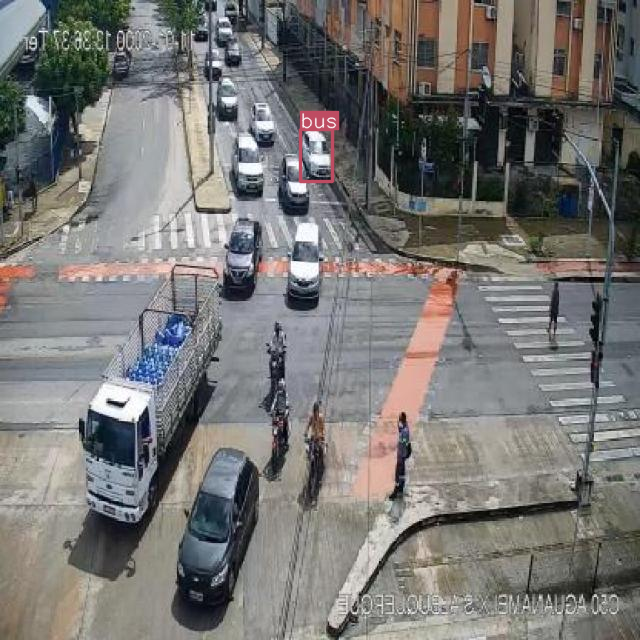

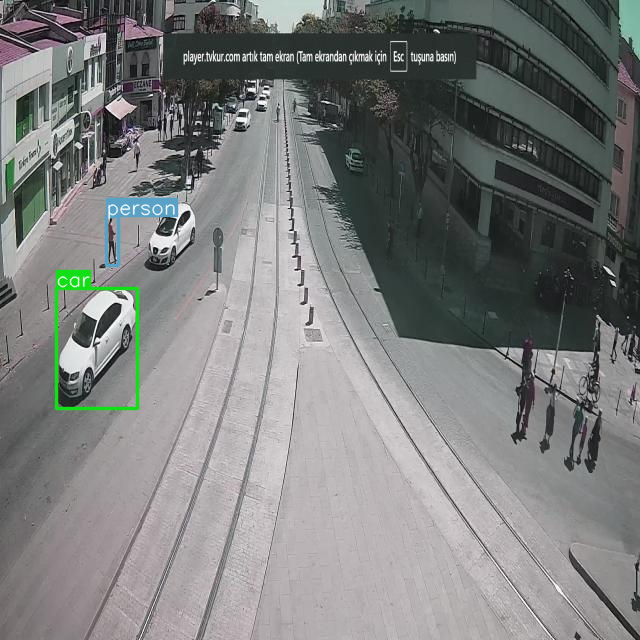

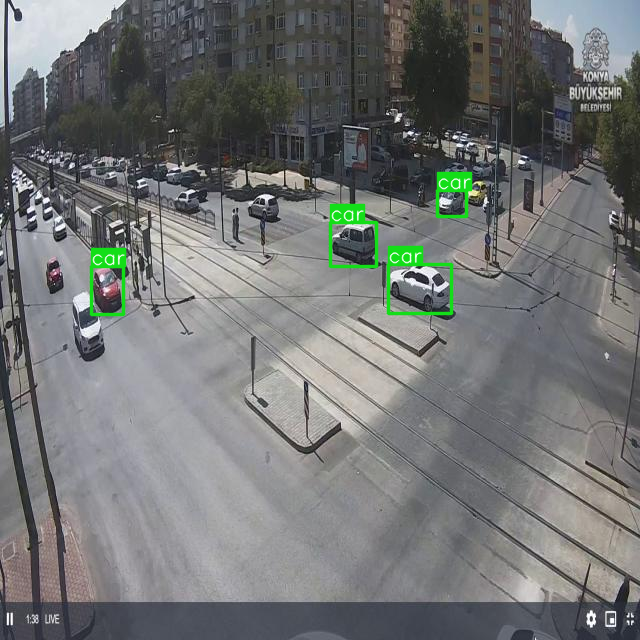

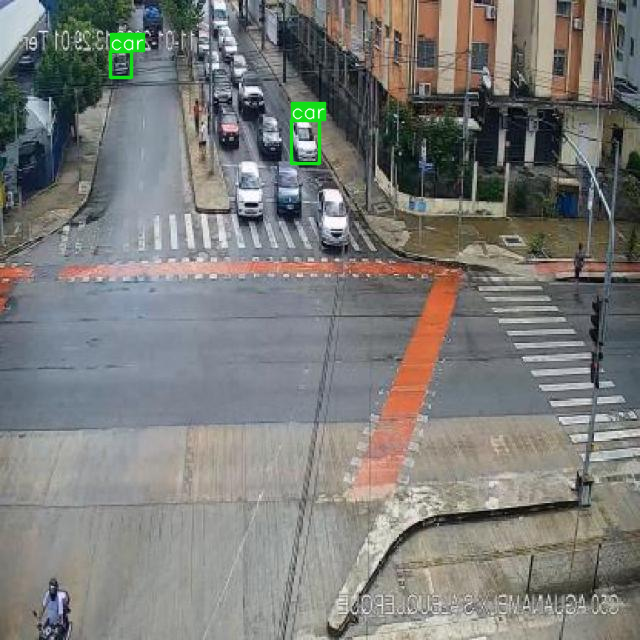

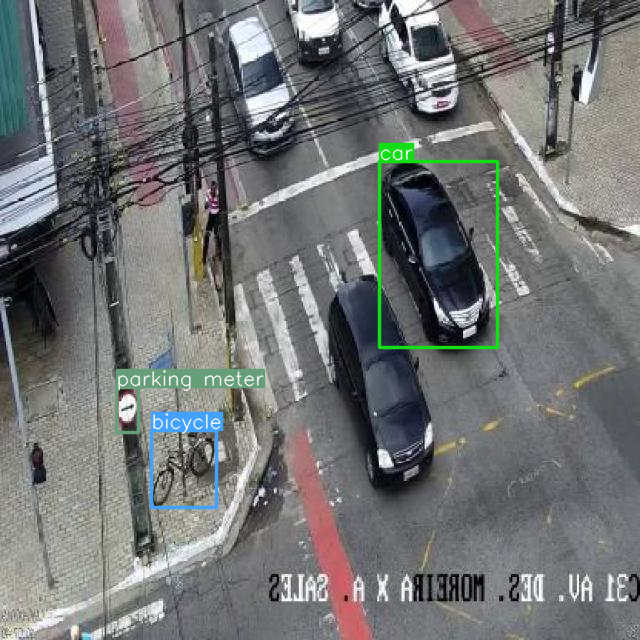

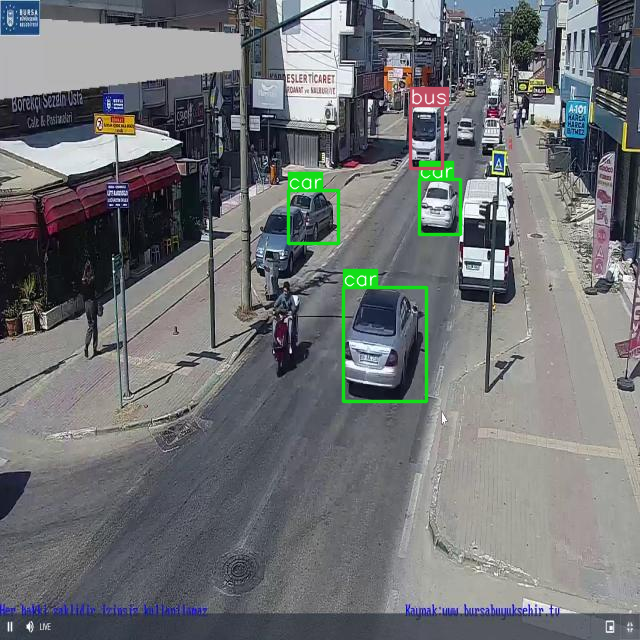

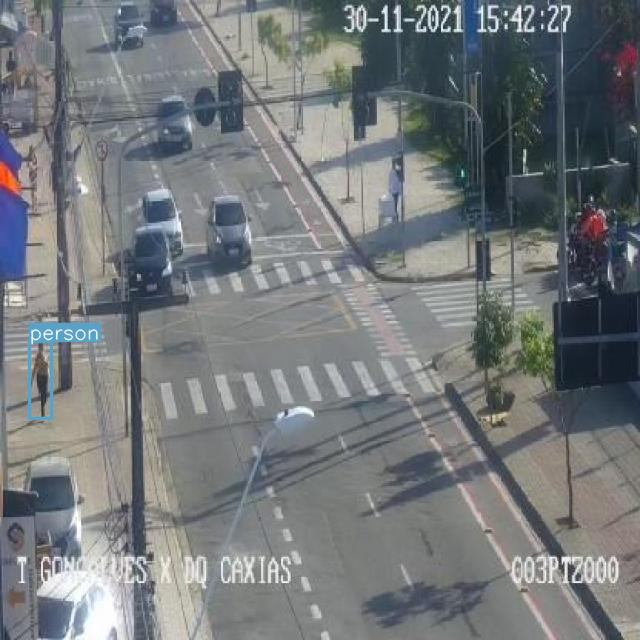

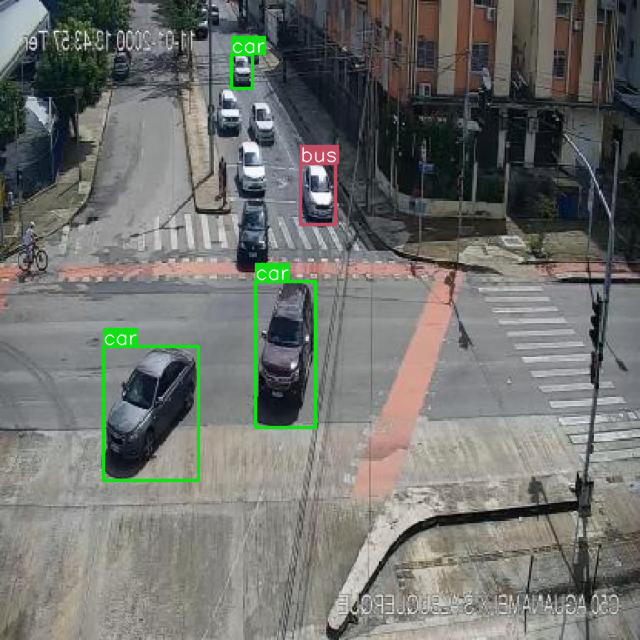

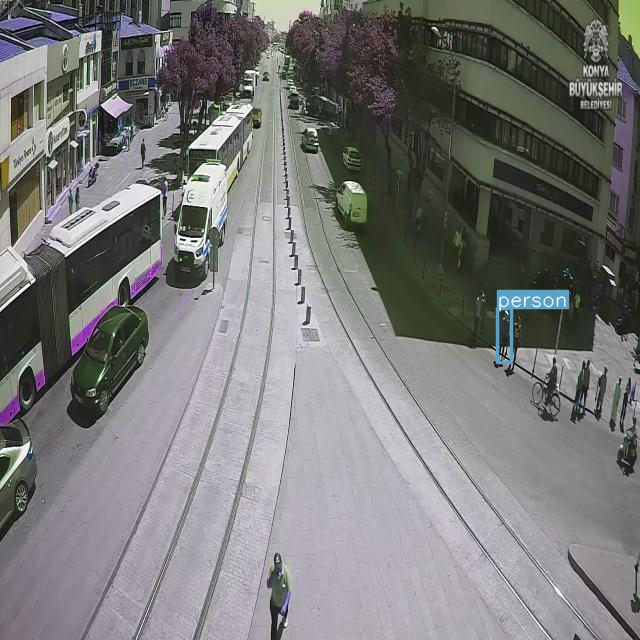

In [ ]:
model = YOLO(f'yolov8n.pt')
for image_name in random_test_images:
        image_path = os.path.join(test_folder, image_name)
        results = model.predict(source=image_path, conf=0.25)
        image = plt.imread(image_path)
        axes[i, j].imshow(image)
        axes[i, j].axis("off")
        image = Image.open(image_path)
        image = np.array(image)
        # mostramos los resultados con confianza > 0.5
        plot_bboxes(image, results[0].boxes.data, score=False, conf=0.5)

Podemos ver que la inferencia no es muy buena. En todas las imágenes de prueba el modelo pierde más de una instancia, y no es capaz de identificar correctamente los objetos de interés (auto, bus, bicicleta, persona, moto).

## Entrenamiento Custom con YOLOv8

Ahora, intentaremos mejorar las métricas entrenando YOLOv8 con nuestro dataset.
Utilizamos YOLOv8 nano para evaluar el modelo considerando sistemas de recursos limitados o aplicaciones en tiempo real.

In [ ]:
model = YOLO(f'yolov8n.pt')
results = model.train(data="/content/traffic-detection-project/data.yaml", epochs=5) # train the model
results = model.val() # evaluate model performance on the validation data set
results = model("/content/traffic-detection-project/test/images/aguanambi-1100_png_jpg.rf.8b7574e1c4f3fd7b654c2a693404fd2d.jpg") # predict on an image
success = YOLO("yolov8n.pt").export(format="onnx") # export a model to ONNX

El modelo YOLOv8 con un entrenamiento de 5 epocas logró los siguientes resultados:

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95
                   all        549       6270      0.844      0.714      0.798      0.535
               bicycle        549        250      0.908      0.684      0.784       0.57
                   bus        549        108      0.881      0.815      0.874      0.699
                   car        549       3842      0.884      0.881      0.939      0.684
             motorbike        549       1238      0.885      0.616      0.757      0.426
                person        549        832       0.66      0.573      0.637      0.298

          
Sin embargo, si miramos las curvas del entrenamiento, podemos ver que siguen con tendencia creciente, por lo que podemos entrenar más épocas para obtener mejores resultados:

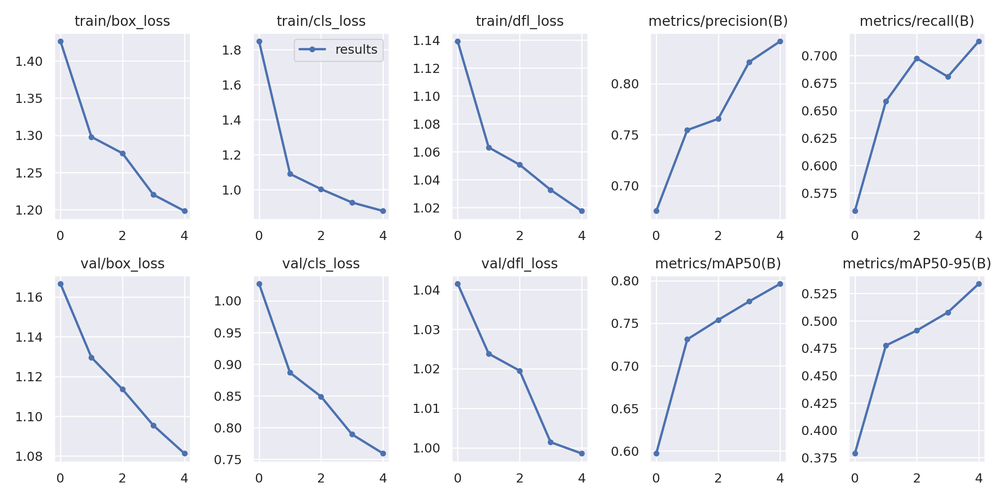

In [ ]:
Image.open("/content/yolov8-5epochs.png")


Por esta razón, entrenamos el modelo con 10 épocas y reevaluamos.

In [ ]:
model = YOLO(f'yolov8n.pt')
results = model.train(data="/content/traffic-detection-project/data.yaml", epochs=10) # train the model
results = model.val() # evaluate model performance on the validation data set
results = model("/content/traffic-detection-project/test/images/aguanambi-1100_png_jpg.rf.8b7574e1c4f3fd7b654c2a693404fd2d.jpg") # predict on an image
success = YOLO("yolov8n.pt").export(format="onnx") # export a model to ONNX

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/traffic-detection-project/data.yaml, epochs=10, patience=50, batch=16, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False,


Las métricas luego de entrenar durante 10 épocas son las siguientes:

                Class     Images  Instances      Box(P          R      mAP50  mAP50-95
                   all        549       6270      0.889      0.788       0.87      0.614
               bicycle        549        250      0.928      0.821       0.87      0.655
                   bus        549        108      0.939      0.859      0.923       0.78
                   car        549       3842      0.879      0.918      0.953      0.721
             motorbike        549       1238      0.909      0.704      0.845      0.506
                person        549        832      0.791      0.638      0.761      0.407

Estos valores son significativamente mejor a la corrida anterior. Además, se puede ver que el entrenamiento no seguirá mejorando significativamente con ésta arquitectura, como se indica en la métrica mAP50:

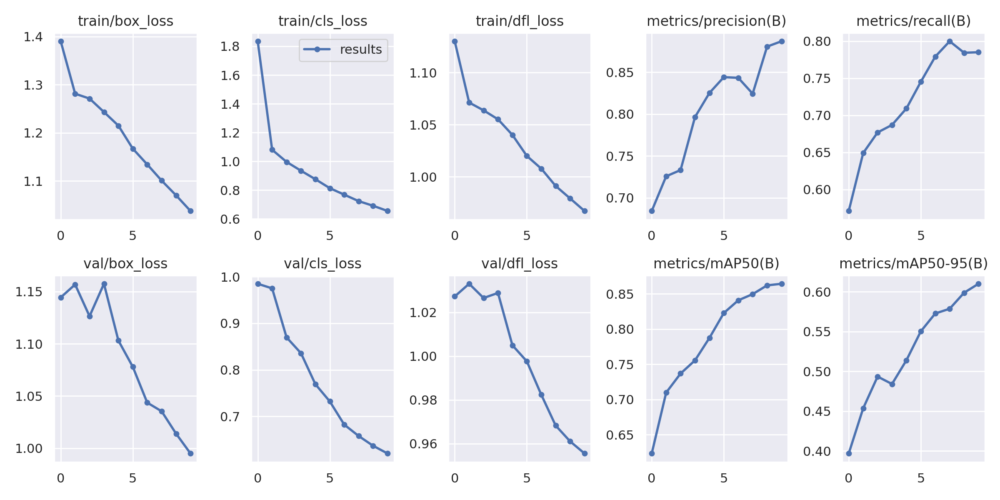

In [ ]:
Image.open(f'/content/runs/detect/train14/results.png')

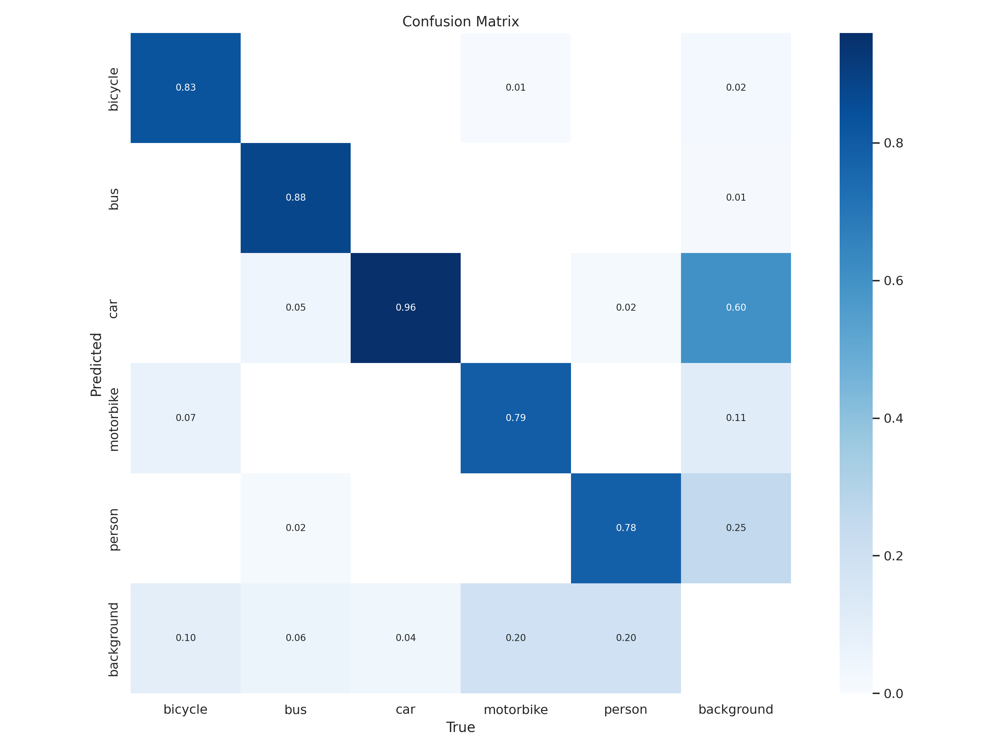

In [ ]:
Image.open(f'/content/runs/detect/train14/confusion_matrix.png')

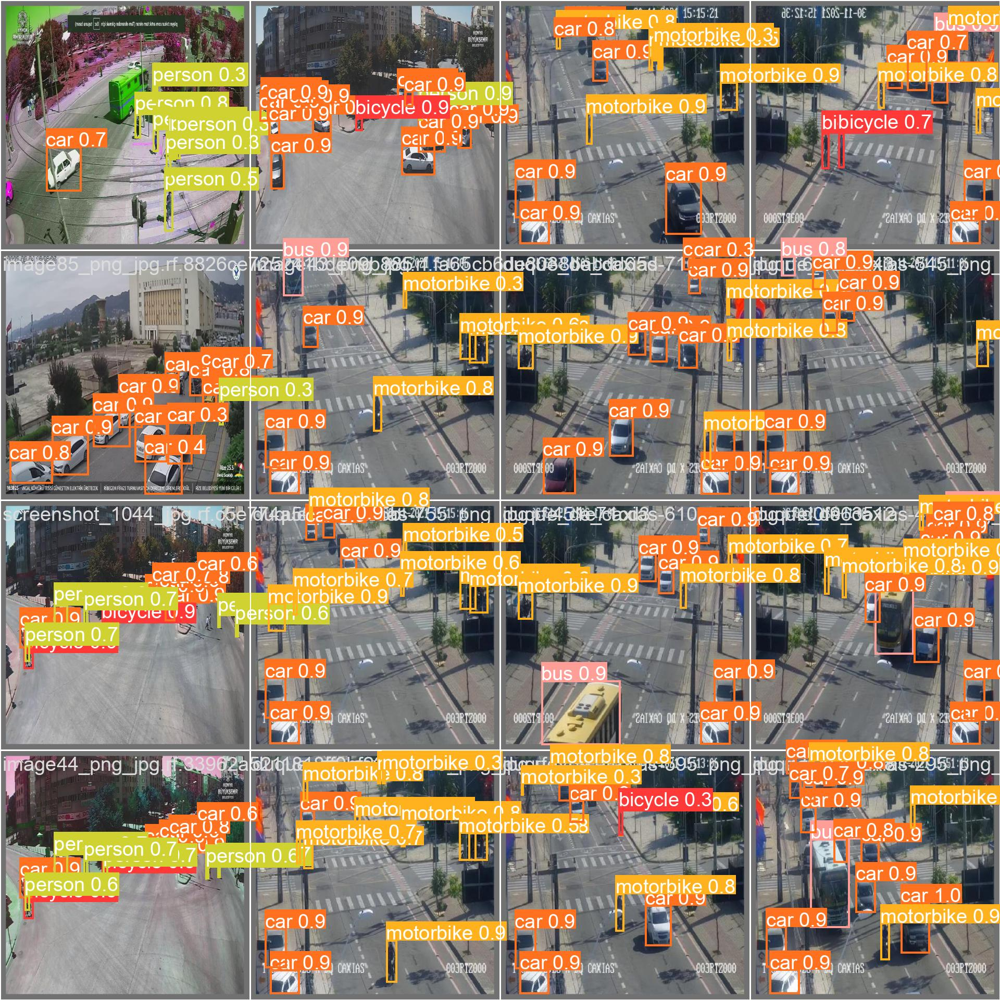

In [ ]:
Image.open(f'/content/runs/detect/train14/val_batch2_pred.jpg')

In [ ]:
!zip -r /content/train14.zip /content/runs/detect/train14
from google.colab import files
files.download("/content/train14.zip")
# Comprimo los datos de entrenamiento en un ZIP y descargo para asegurarlos

## Evaluación de performance con YOLOv8
Ahora, evaluaremos el tiempo de inferencia del modelo para el dataset de test.

In [ ]:
img_path = "/content/traffic-detection-project/test/images/aguanambi-1000_png_jpg.rf.7179a0df58ad6448028bc5bc21dca41e.jpg"

test_folder = image_folders['test']
total_time = 0.0
num_images = 0

for entry in os.listdir(test_folder):
  if os.path.isfile(os.path.join(folder, entry)):
    st = time.time()
    results = model.predict(img_path)
    et = time.time()
    total_time += (et - st)
    num_images += 1

print(f'Tardó {total_time} segundos para procesar {num_images} imagenes (Promedio={total_time/num_images} segundos / imagen)')

Tardó 5.01387357711792 segundos para procesar 279 imagenes (Promedio=0.017970873036264944 segundos / imagen)


## Cargamos el modelo

In [ ]:
!unzip /content/train14-10epochs.zip

In [14]:
weight_path = '/content/content/runs/detect/train14/weights/best.pt'
model = YOLO(weight_path)

In [16]:

results = model.predict()

In [ ]:
!pip install ultra

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs


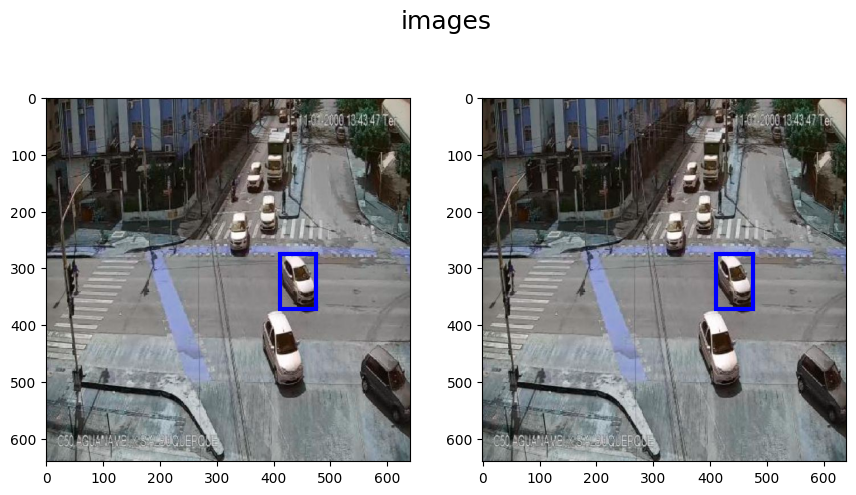

In [24]:
from PIL import Image
import cv2
from matplotlib.patches import Rectangle



image_path = '/content/traffic-detection-project/valid/images/aguanambi-3555_png_jpg.rf.d67fd178d83610017c5e241b94de75a8.jpg'
images = [image_path, image_path]
im1 = cv2.imread(images[0])
im2 = cv2.imread(images[0])

model = YOLO('yolov8n.pt')
results = model.predict(source=[im1, im2])

fig, axs = plt.subplots(1,2, figsize=(10, 6))
axs = axs.ravel()
plt.subplots_adjust(left=0.1,bottom=0.1,
                    right=0.9, top=0.9,
                    wspace=0.2, hspace=0.4)

fig.suptitle("images", fontsize=18, y=0.95)

for i, (r, im) in enumerate(zip(results, images)):

    image = cv2.imread(im)

    c = r.boxes.xywh.tolist()[0] # To get the coordinates.
    x, y, w, h = c[0], c[1], c[2], c[3] # x, y are the center coordinates.

    axs[i].imshow(image)
    axs[i].add_patch(Rectangle((x-w/2, y-h/2), w, h,
                     edgecolor='blue', facecolor='none',
                     lw=3))

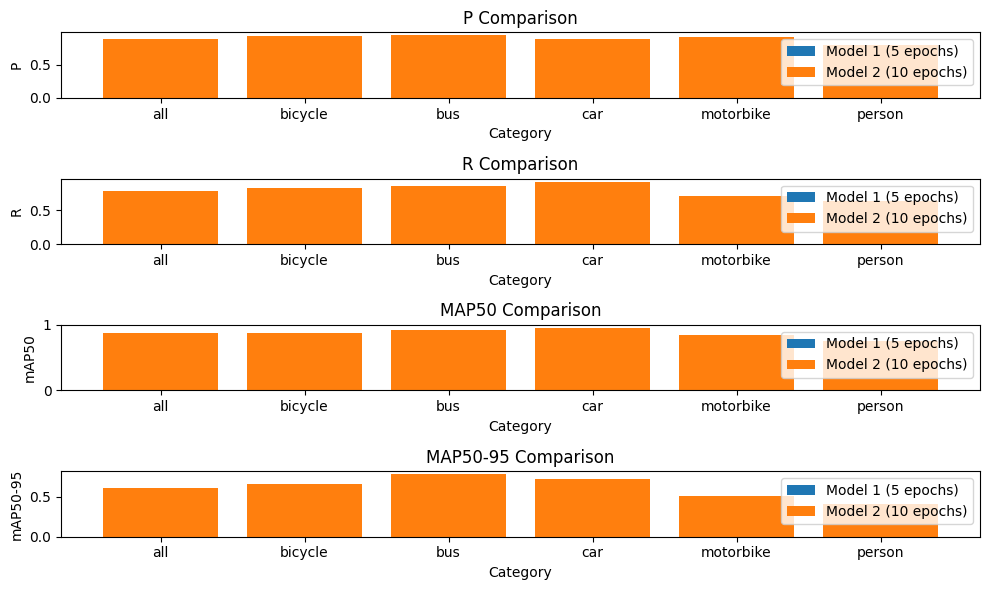

In [25]:
import matplotlib.pyplot as plt

# Model 1 data (5 epochs)
model_1_data = {
    "all": {"P": 0.844, "R": 0.714, "mAP50": 0.798, "mAP50-95": 0.535},
    "bicycle": {"P": 0.908, "R": 0.684, "mAP50": 0.784, "mAP50-95": 0.57},
    "bus": {"P": 0.881, "R": 0.815, "mAP50": 0.874, "mAP50-95": 0.699},
    "car": {"P": 0.884, "R": 0.881, "mAP50": 0.939, "mAP50-95": 0.684},
    "motorbike": {"P": 0.885, "R": 0.616, "mAP50": 0.757, "mAP50-95": 0.426},
    "person": {"P": 0.66, "R": 0.573, "mAP50": 0.637, "mAP50-95": 0.298},
}

# Model 2 data (10 epochs)
model_2_data = {
    "all": {"P": 0.889, "R": 0.788, "mAP50": 0.87, "mAP50-95": 0.614},
    "bicycle": {"P": 0.928, "R": 0.821, "mAP50": 0.87, "mAP50-95": 0.655},
    "bus": {"P": 0.939, "R": 0.859, "mAP50": 0.923, "mAP50-95": 0.78},
    "car": {"P": 0.879, "R": 0.918, "mAP50": 0.953, "mAP50-95": 0.721},
    "motorbike": {"P": 0.909, "R": 0.704, "mAP50": 0.845, "mAP50-95": 0.506},
    "person": {"P": 0.791, "R": 0.638, "mAP50": 0.761, "mAP50-95": 0.407},
}

# Define categories and metrics
categories = ["all", "bicycle", "bus", "car", "motorbike", "person"]
metrics = ["P", "R", "mAP50", "mAP50-95"]

import seaborn as sns
sns.set_theme(style="whitegrid")


# Draw a nested barplot by species and sex
g = sns.catplot(
    data=penguins, kind="bar",
    x="species", y="body_mass_g", hue="sex",
    errorbar="sd", palette="dark", alpha=.6, height=6
)
g.despine(left=True)
g.set_axis_labels("", "Body mass (g)")
g.legend.set_title("")
